In [1]:
'''
This Notebook is for the first step of the yeast genome project: data exploration.
There are 4 input vcf files stored in ./vcf_files:
1039_all2.vcf, 1051_all2.vcf, 1063_all2.vcf, and 1069_all2.vcf
we will look at each one of them and make some figures about the detials.
later, we will try to some filering... 
'''
# import required packages
import numpy as np
import scipy
import pandas as pd
import itertools
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style('white')
sns.set_style('ticks')
sns.set_context('notebook')
import h5py
import allel; print('scikit-allel', allel.__version__)

scikit-allel 1.3.7


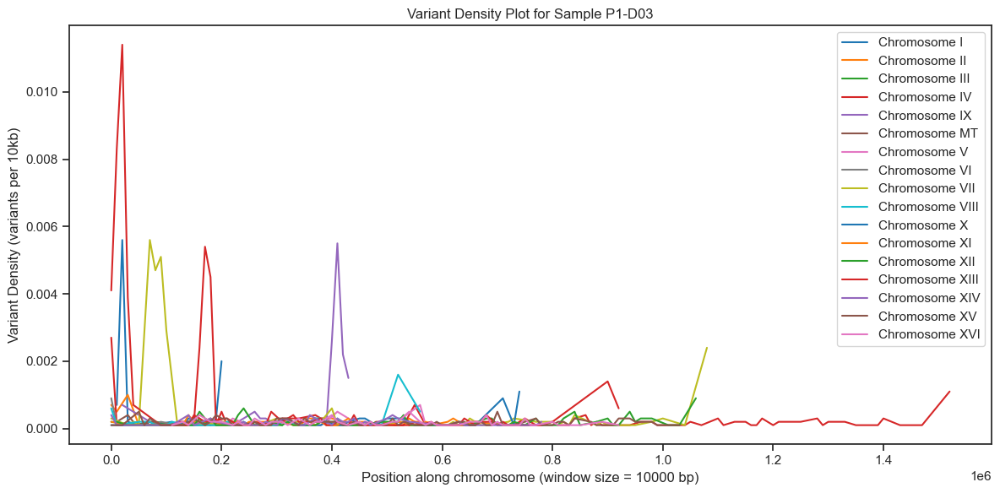

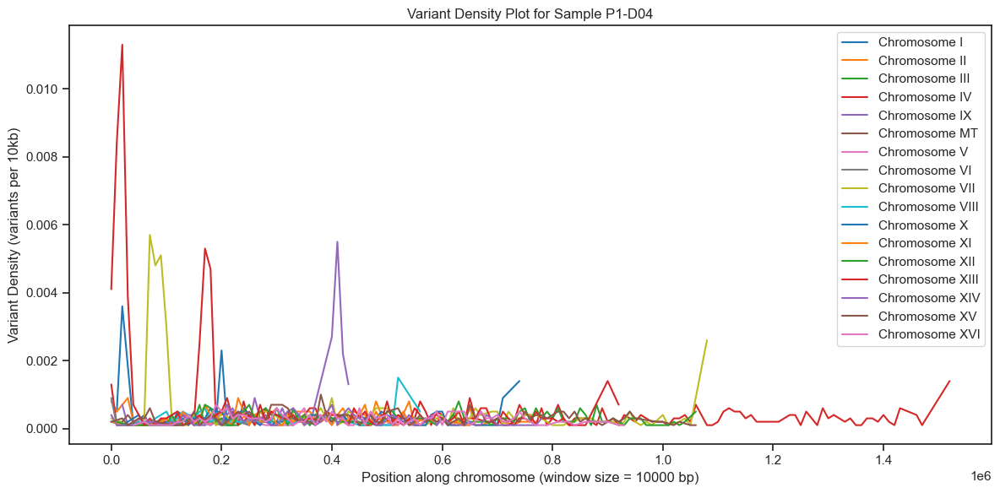

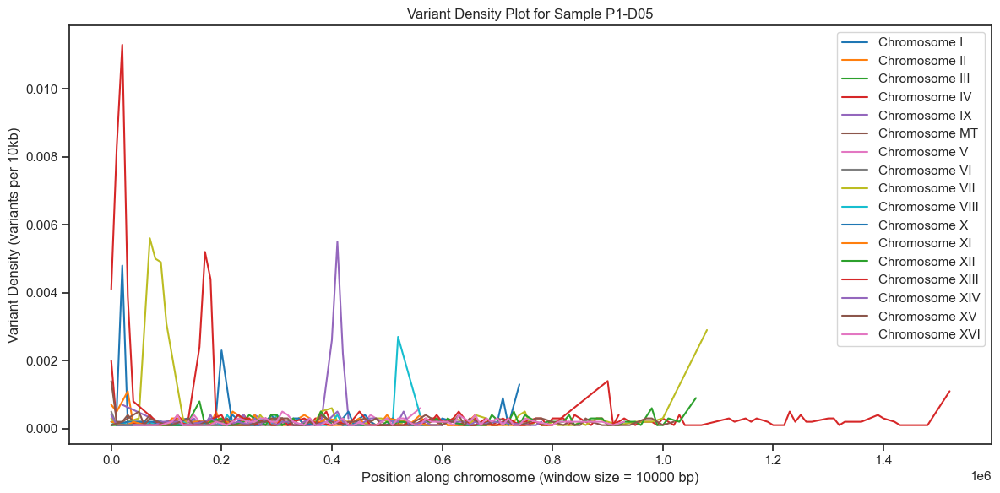

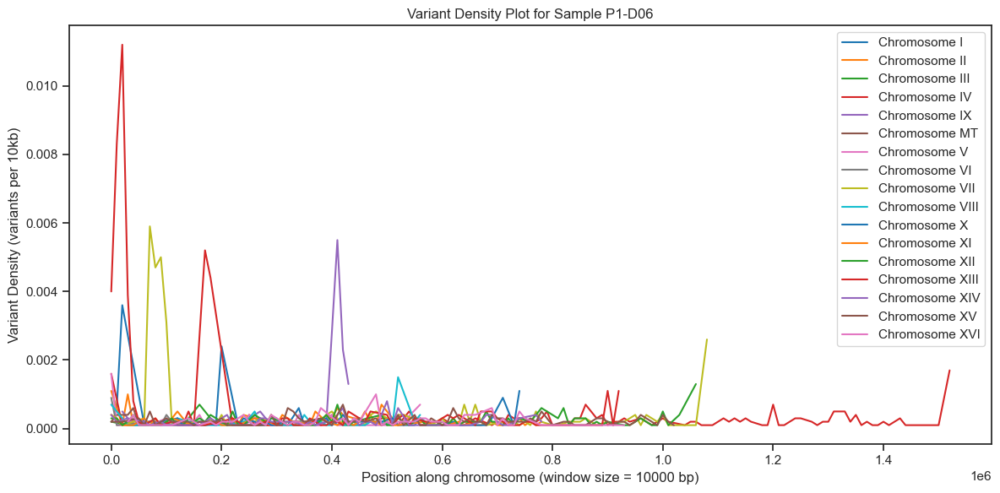

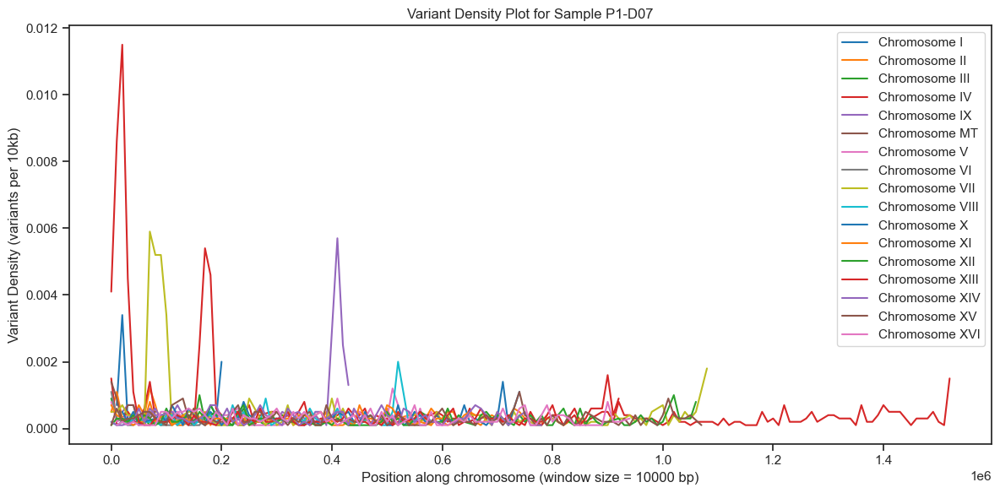

...

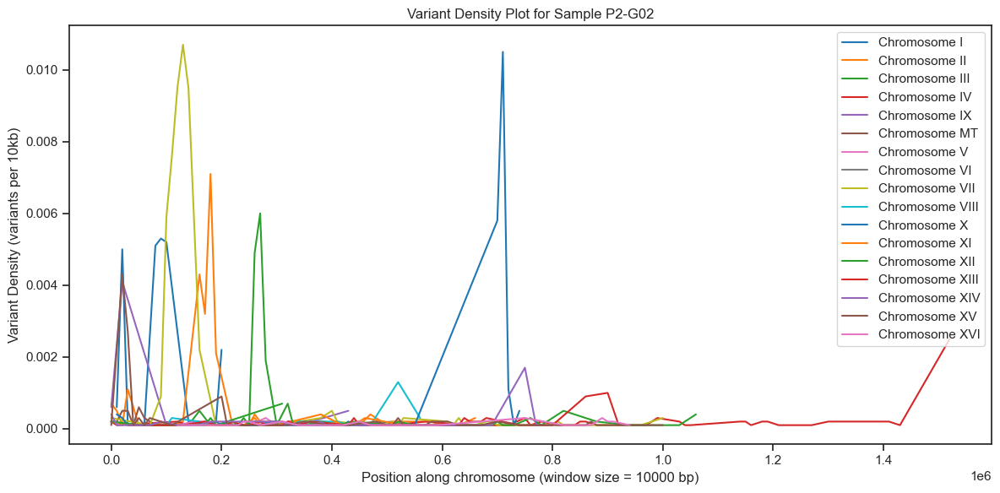

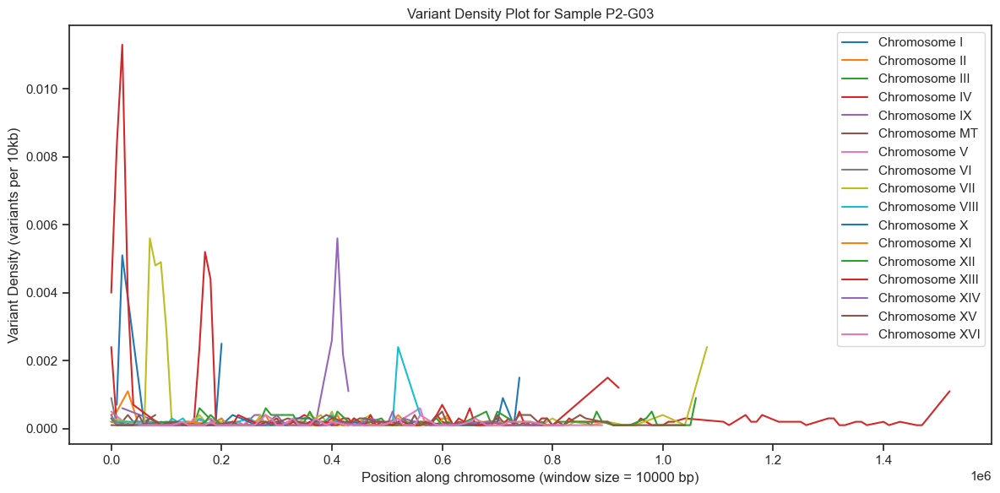

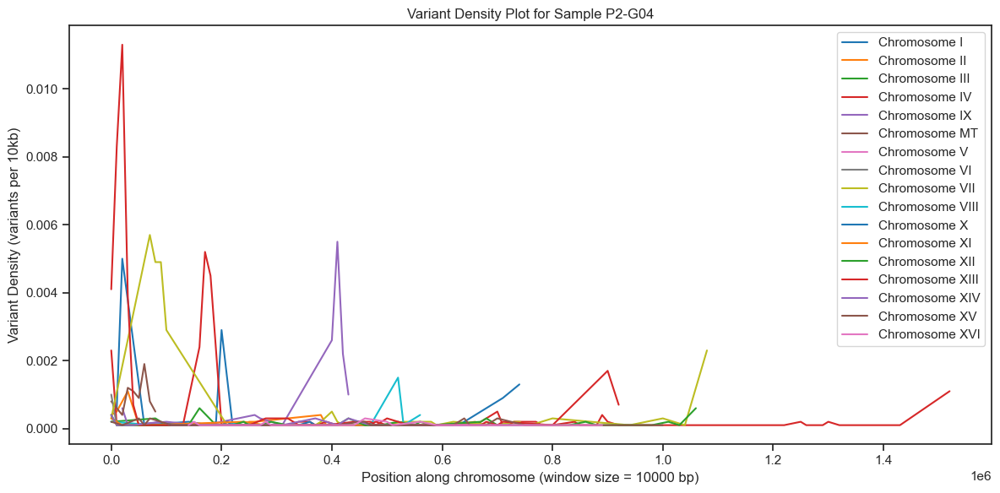

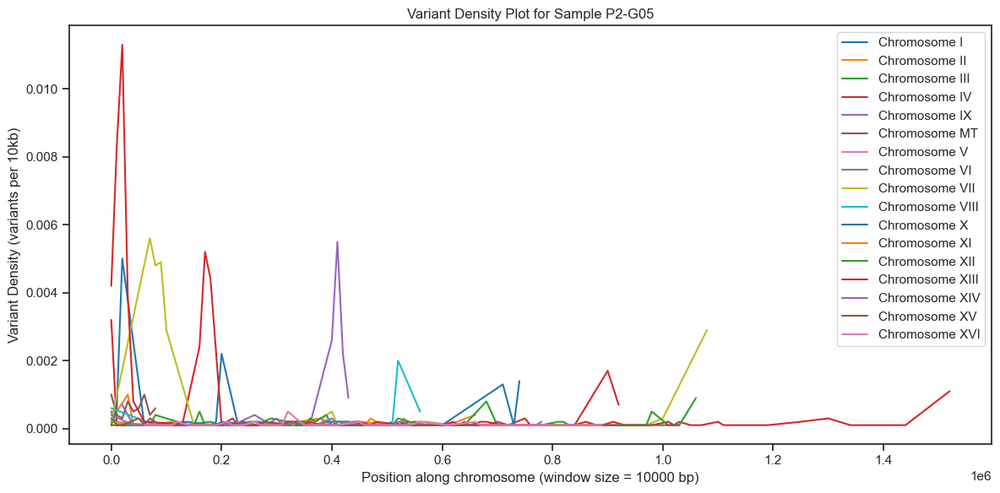

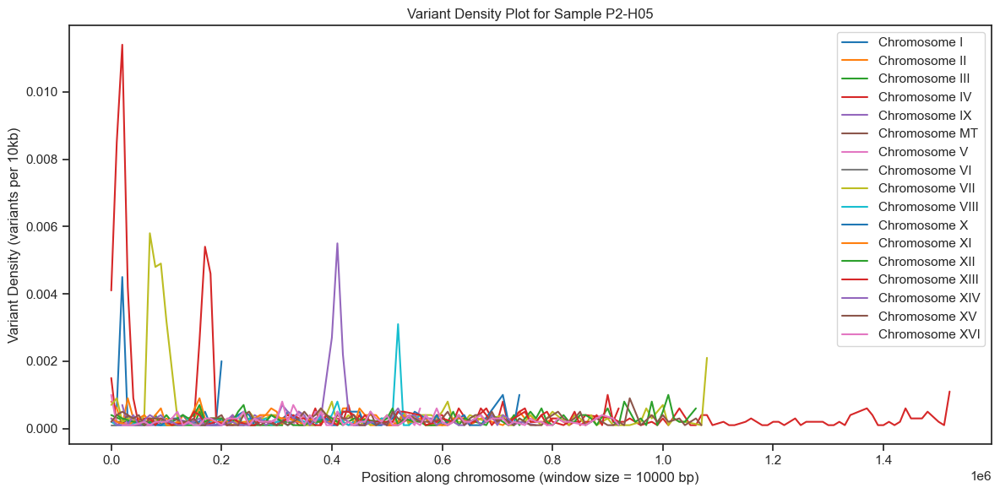

In [22]:
'''
Visualize variant density.
Make a plot of variant density, which will simply show us how many SNPs there are and how they are distributed along the chromosome.
'''
import allel
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Read VCF file including genotype data
callset = allel.read_vcf("./vcf_files/1039_all2.vcf", fields=['samples', 'variants/CHROM', 'variants/POS', 'calldata/GT'])

samples = callset['samples']
chromosomes = callset['variants/CHROM']
positions = callset['variants/POS']
genotypes = allel.GenotypeArray(callset['calldata/GT'])

# Define window size
window_size = 10000

# Iterate through each sample to calculate variant density
for sample_idx, sample in enumerate(samples):
    # Determine if the variant is present (homozygous or heterozygous)
    is_variant = genotypes[:, sample_idx].is_called()
    
    # Create DataFrame for this sample
    df_sample = pd.DataFrame({
        'CHROM': chromosomes[is_variant],
        'POS': positions[is_variant]
    })
    
    # Calculate variant density
    df_sample['window_pos'] = (df_sample['POS'] // window_size) * window_size
    variant_density = df_sample.groupby(['CHROM', 'window_pos']).size().reset_index(name='count')
    variant_density['density'] = variant_density['count'] / window_size
    
    # Plot for this sample
    plt.figure(figsize=(12, 6))
    for chrom in variant_density['CHROM'].unique():
        chrom_data = variant_density[variant_density['CHROM'] == chrom]
        plt.plot(chrom_data['window_pos'], chrom_data['density'], label=f'Chromosome {chrom}')
    
    plt.xlabel('Position along chromosome (window size = 10000 bp)')
    plt.ylabel('Variant Density (variants per 10kb)')
    plt.title(f'Variant Density Plot for Sample {sample}')
    plt.legend()
    plt.tight_layout()
    plt.show()


/Users/congliu/miniconda3/envs/popgen/lib/python3.11/site-packages/allel/io/vcf_read.py:1732: UserWarning: invalid INFO header: '##INFO=<ID=VDB,Number=1,Type=Float,Description="Variant Distance Bias for filtering splice-site artefacts in RNA-seq data (bigger is better)",Version="3">\n'
  warnings.warn('invalid INFO header: %r' % header)


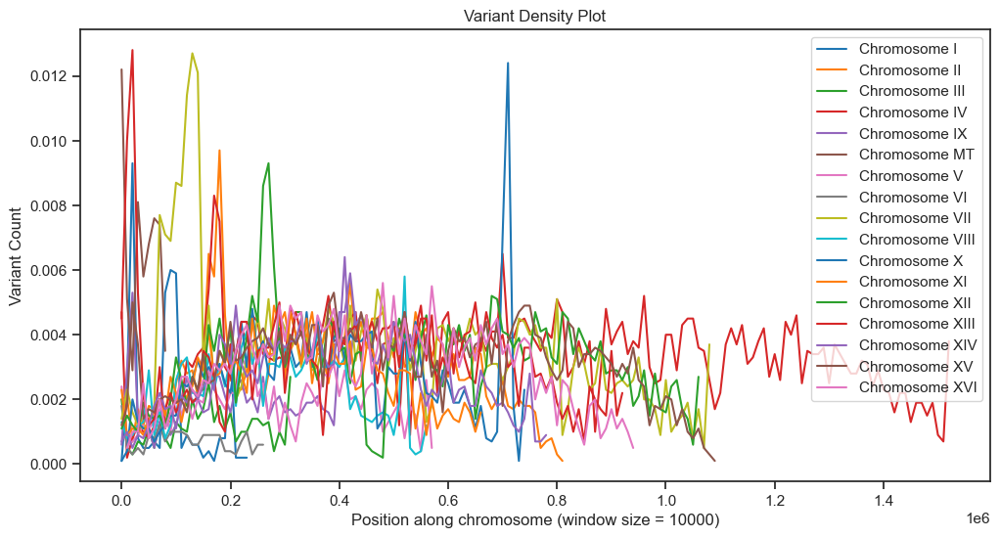

In [287]:
'''
Visualize variant density.
Make a plot of variant density, which will simply show us how many SNPs there are and how they are distributed along the chromosome.
'''
# read vcf file
callset = allel.read_vcf("./vcf_files/1039_all2.vcf", fields=['variants/CHROM', 'variants/POS'])
# Create a DataFrame
df = pd.DataFrame({
    'CHROM': callset['variants/CHROM'],
    'POS': callset['variants/POS']
})

# Define window size (base pairs)
window_size = 10000

# Calculate variant density
df['window_pos'] = (df['POS'] // window_size) * window_size
variant_density = df.groupby(['CHROM', 'window_pos']).size().reset_index(name='count')
variant_density['density'] = variant_density['count'] / window_size

# Plot for each chromosome
plt.figure(figsize=(12, 6))

for chrom in variant_density['CHROM'].unique():
    chrom_data = variant_density[variant_density['CHROM'] == chrom]
    plt.plot(chrom_data['window_pos'], chrom_data['density'], label=f'Chromosome {chrom}')

plt.xlabel('Position along chromosome (window size = 10000)')
plt.ylabel('Variant Count')
plt.title('Variant Density Plot')
plt.legend()
plt.savefig('./figures/1039/Variant_Density_Plot.pdf') # change the path for different strains
plt.show()

/Users/congliu/miniconda3/envs/popgen/lib/python3.11/site-packages/allel/io/vcf_read.py:1732: UserWarning: invalid INFO header: '##INFO=<ID=VDB,Number=1,Type=Float,Description="Variant Distance Bias for filtering splice-site artefacts in RNA-seq data (bigger is better)",Version="3">\n'
  warnings.warn('invalid INFO header: %r' % header)


Sample P1-D03: 93.94% missing
Sample P1-D04: 89.65% missing
Sample P1-D05: 93.07% missing
Sample P1-D06: 92.29% missing
Sample P1-D07: 87.76% missing
Sample P1-D12: 92.70% missing
Sample P1-E01: 92.87% missing
Sample P1-E06: 92.75% missing
Sample P1-E07: 89.35% missing
Sample P1-E08: 94.13% missing
Sample P1-E09: 91.64% missing
Sample P1-E10: 93.86% missing
Sample P2-D10: 94.97% missing
Sample P2-D11: 94.98% missing
Sample P2-D12: 94.80% missing
Sample P2-E01: 94.81% missing
Sample P2-E08: 94.34% missing
Sample P2-E09: 95.36% missing
Sample P2-E10: 95.45% missing
Sample P2-E11: 93.72% missing
Sample P2-E12: 95.36% missing
Sample P2-F06: 94.48% missing
Sample P2-F07: 95.39% missing
Sample P2-F08: 93.10% missing
Sample P2-F09: 94.70% missing
Sample P2-G02: 94.24% missing
Sample P2-G03: 94.02% missing
Sample P2-G04: 95.86% missing
Sample P2-G05: 95.51% missing
Sample P2-H05: 90.64% missing


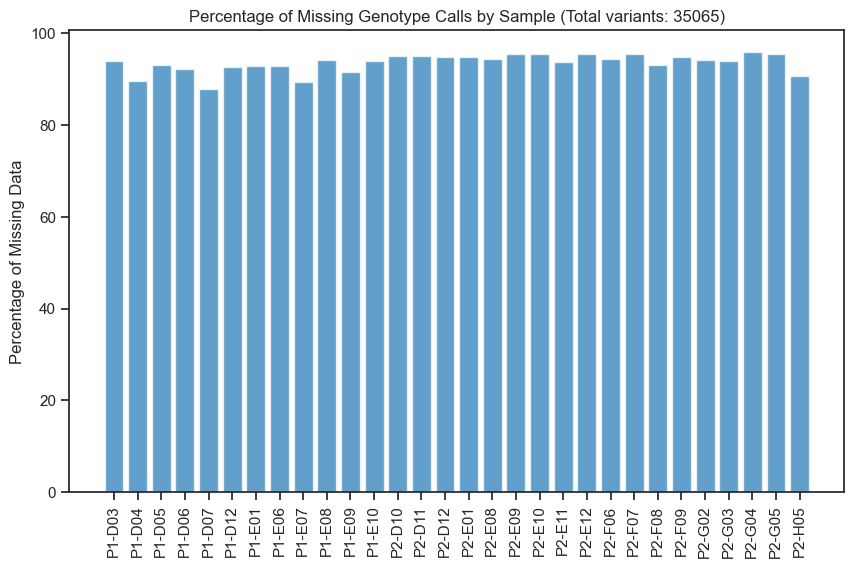

In [288]:
'''
Sample QC.
Compute the percent of missing and heterozygous genotype calls for each sample.
'''

# Load VCF data (only the genotype information)
callset = allel.read_vcf('./vcf_files/1039_all2.vcf', fields='*')

# Extract genotype data
gt = allel.GenotypeArray(callset['calldata/GT'])

# Extract sample names
samples = callset['samples']

# Initialize arrays to store the percentages
percent_missing = np.zeros(gt.n_samples)
percent_heterozygous = np.zeros(gt.n_samples)
total_variants = gt.n_variants
# Calculate percentages
for i in range(gt.n_samples):
    # Count missing genotypes (./.)
    n_missing = np.sum(gt.is_missing()[:, i])
    percent_missing[i] = (n_missing / gt.n_variants) * 100

    # Count heterozygous genotypes (e.g., 0/1, 1/0)
    #n_heterozygous = np.sum(gt.is_het()[:, i])
    #percent_heterozygous[i] = (n_heterozygous / gt.n_variants) * 100

# Print results with real sample names
for i, sample in enumerate(samples):
    #print(f"Sample {sample}: {percent_missing[i]:.2f}% missing, {percent_heterozygous[i]:.2f}% heterozygous")
    print(f"Sample {sample}: {percent_missing[i]:.2f}% missing")

# Plotting
plt.figure(figsize=(10, 6))
x = np.arange(gt.n_samples)  # the label locations

plt.bar(x, percent_missing, align='center', alpha=0.7)
plt.xticks(x, samples, rotation='vertical')
plt.ylabel('Percentage of Missing Data')
plt.title('Percentage of Missing Genotype Calls by Sample'+' (Total variants: %s)'%total_variants)
# Save the figure
plt.savefig('./figures/1039/missing_by_samples.pdf') # change the path for different strains
plt.show()

/Users/congliu/miniconda3/envs/popgen/lib/python3.11/site-packages/allel/io/vcf_read.py:1732: UserWarning: invalid INFO header: '##INFO=<ID=VDB,Number=1,Type=Float,Description="Variant Distance Bias for filtering splice-site artefacts in RNA-seq data (bigger is better)",Version="3">\n'
  warnings.warn('invalid INFO header: %r' % header)


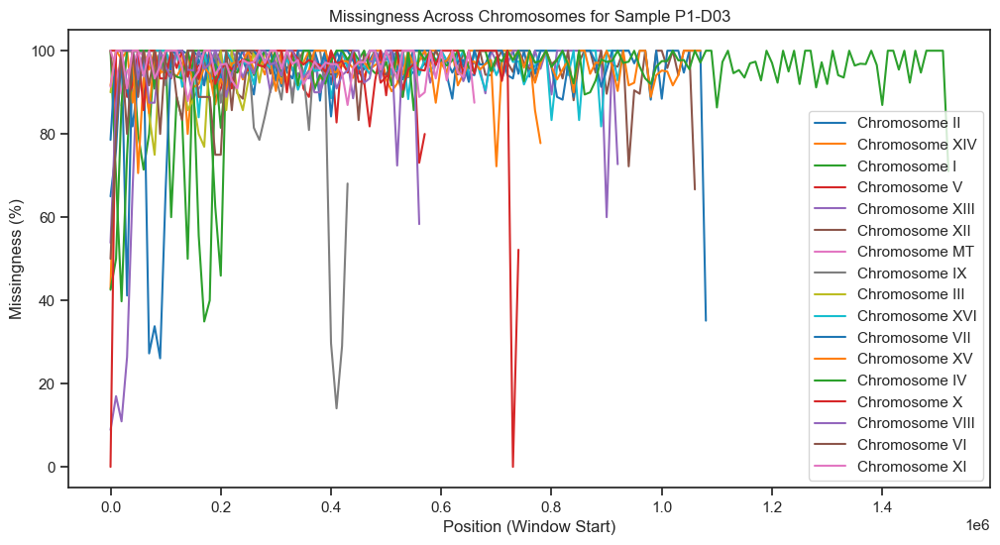

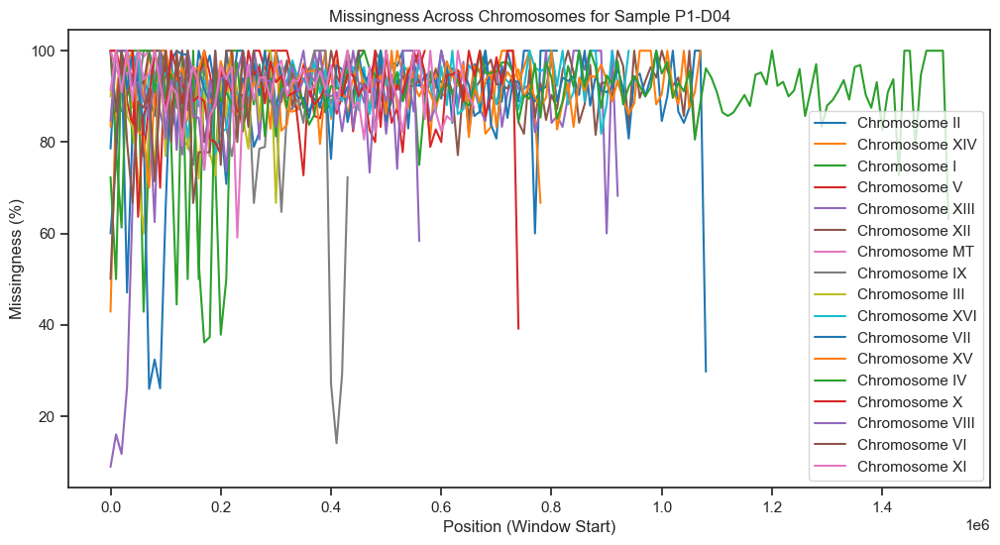

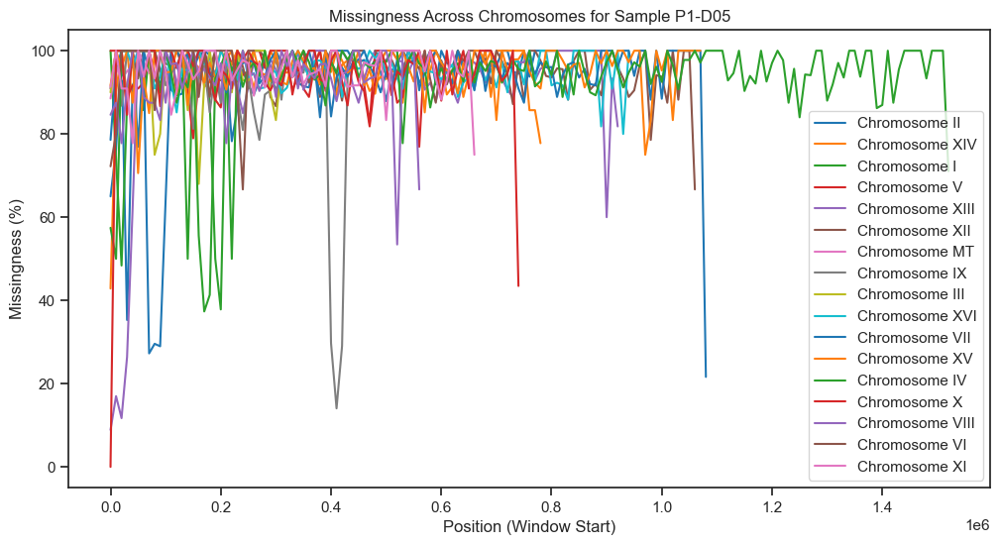

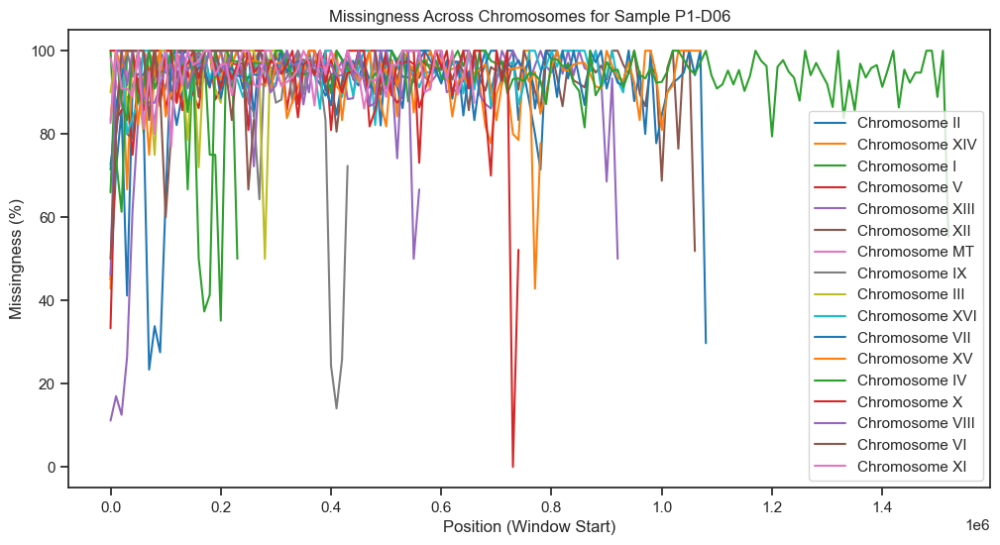

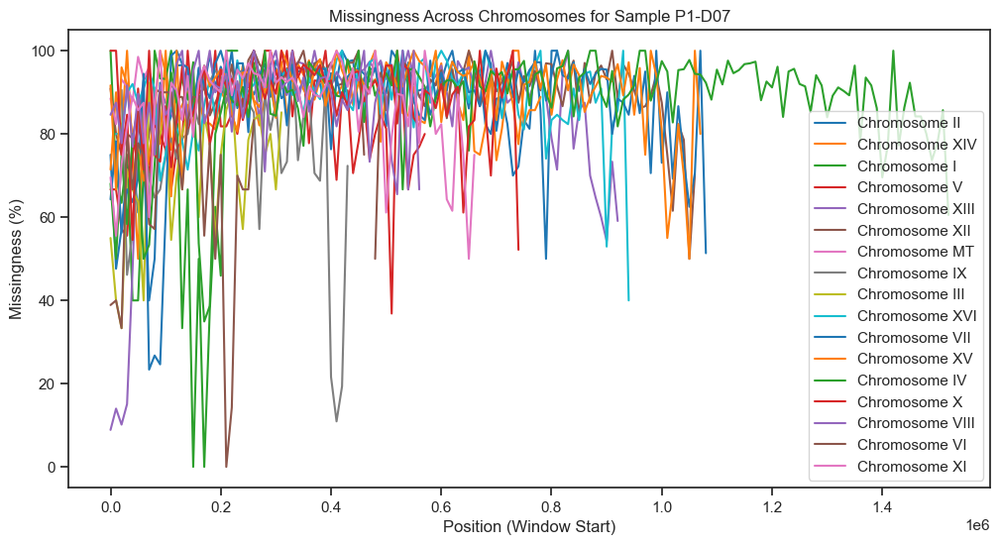

...

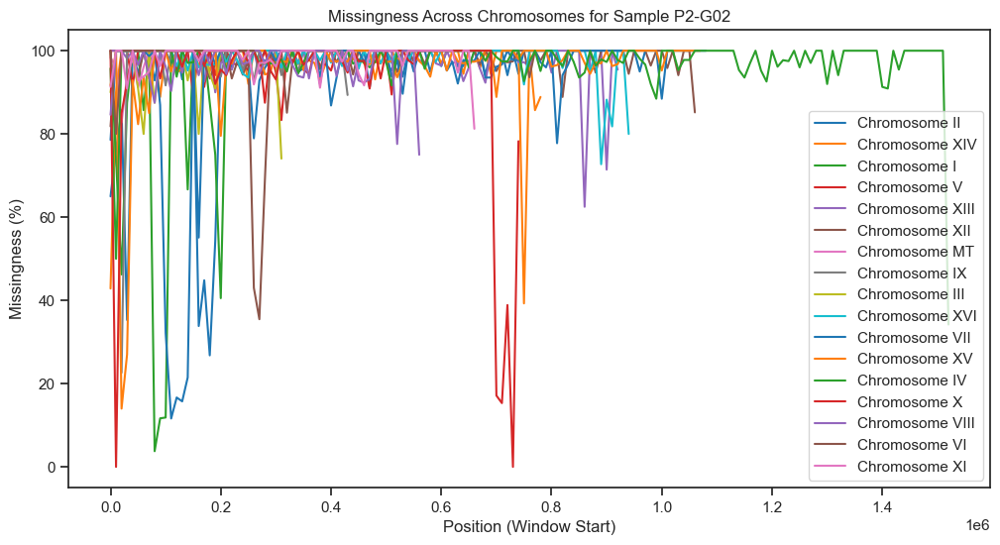

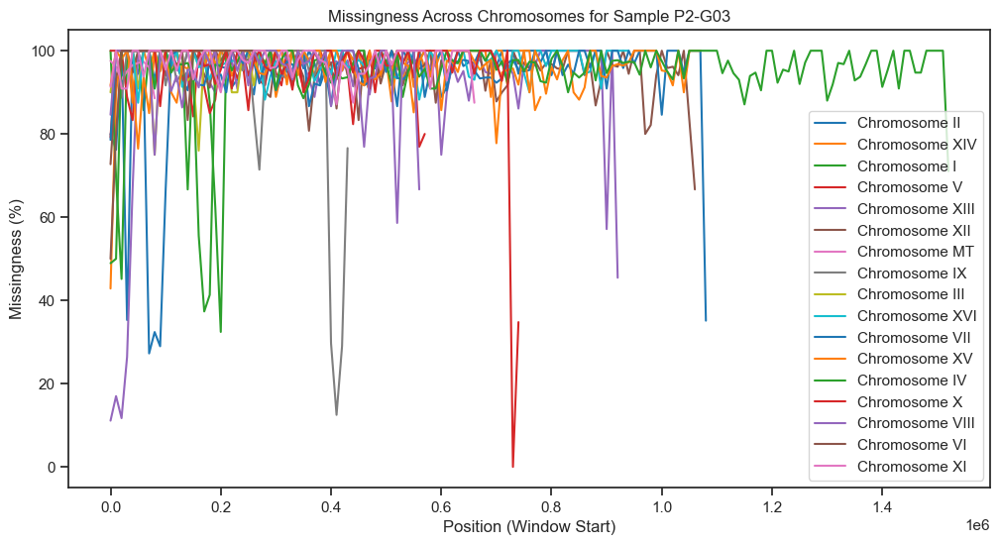

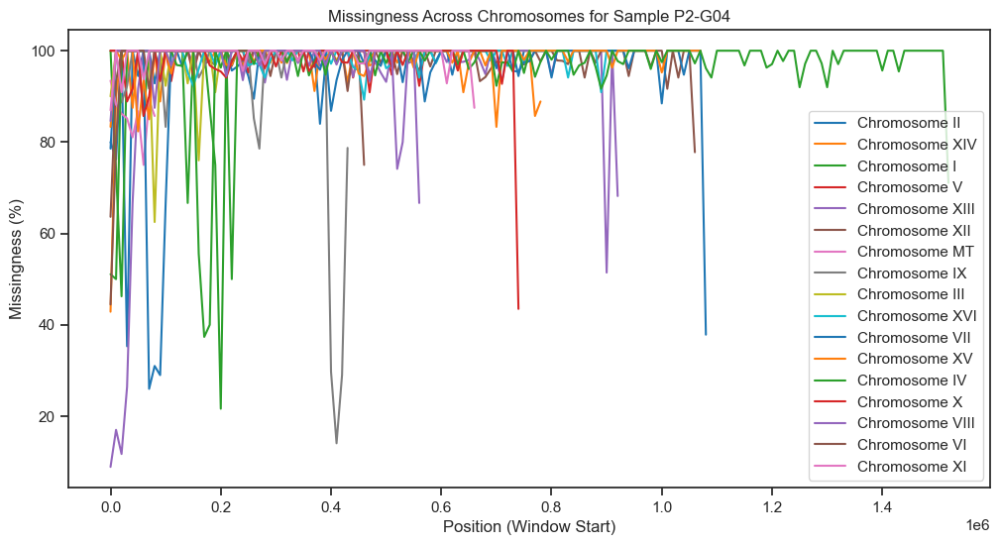

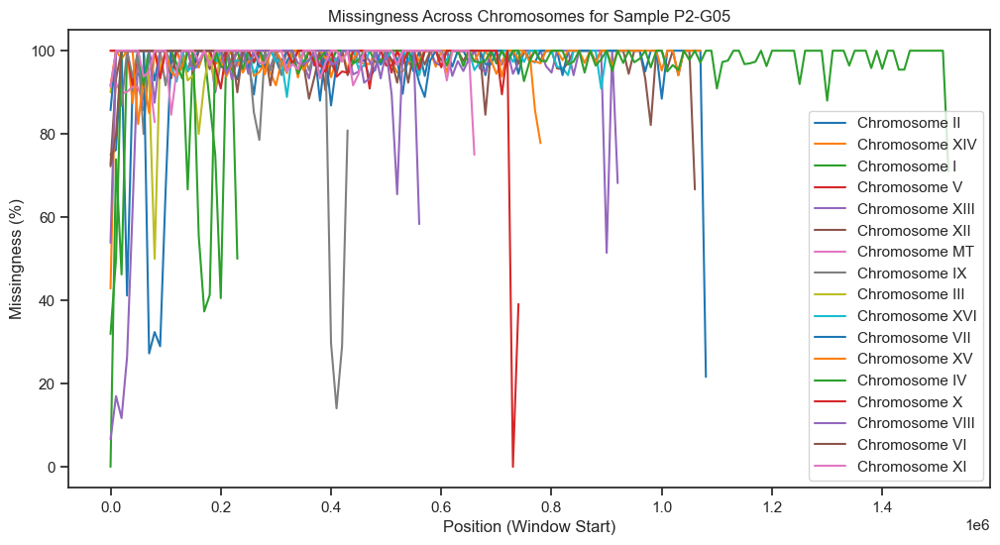

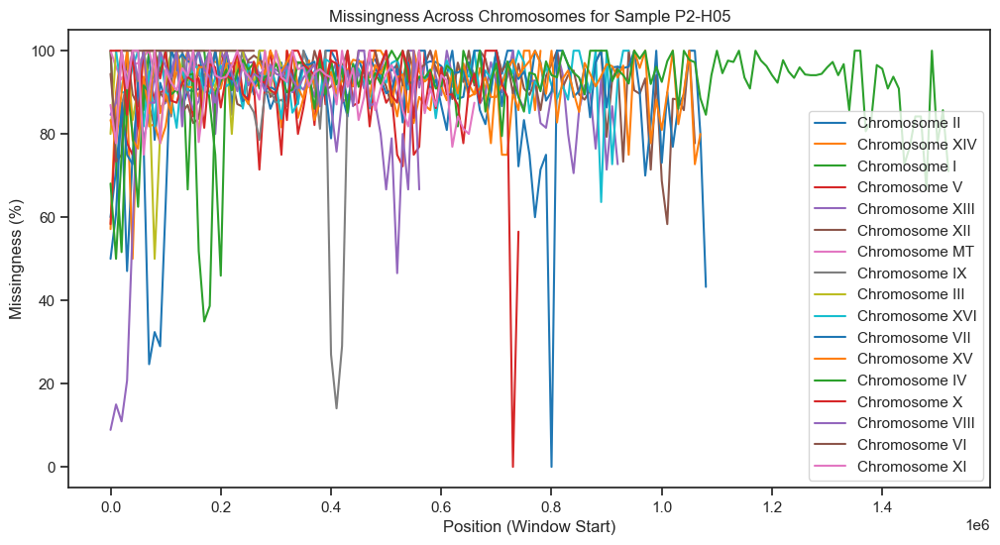

In [289]:
'''
Plot missingness for each sample over the chromosome.

'''
# Load the VCF data
callset = allel.read_vcf("./vcf_files/1039_all2.vcf", fields=['samples', 'calldata/GT', 'variants/POS', 'variants/CHROM'])

# Extract required data
gt = allel.GenotypeArray(callset['calldata/GT'])
positions = callset['variants/POS']
chromosomes = callset['variants/CHROM']
samples = callset['samples']
# Define the window size
window_size = 10000  # 1 Mb, for example

# Prepare DataFrame for missingness data
df_missingness = []

# Iterate over each chromosome
for chrom in set(chromosomes):
    # Filter data for the current chromosome
    idx = chromosomes == chrom
    gt_chrom = gt[idx]
    pos_chrom = positions[idx]

    # Bin positions
    bins = np.arange(0, pos_chrom.max(), window_size)
    binned_pos = np.digitize(pos_chrom, bins)

    # Calculate missingness per bin for each sample
    for i, sample in enumerate(samples):
        for b in range(len(bins)):
            window_mask = binned_pos == b + 1
            n_missing = np.sum(gt_chrom.subset(window_mask)[:, i].is_missing())
            n_total = np.sum(window_mask)
            if n_total > 0:
                missingness = (n_missing / n_total) * 100
            else:
                missingness = np.nan  # Handle case with no data in the window
            df_missingness.append({'Sample': sample, 'Chromosome': chrom, 'Window': bins[b], 'Missingness': missingness})

# Convert to DataFrame
df_missingness = pd.DataFrame(df_missingness)

# Plot missingness for each sample
for sample in df_missingness['Sample'].unique():
    sample_data = df_missingness[df_missingness['Sample'] == sample]
    plt.figure(figsize=(12, 6))
    for chrom in sample_data['Chromosome'].unique():
        chrom_data = sample_data[sample_data['Chromosome'] == chrom]
        plt.plot(chrom_data['Window'], chrom_data['Missingness'], label=f'Chromosome {chrom}')
    plt.title(f"Missingness Across Chromosomes for Sample {sample}")
    plt.xlabel('Position (Window Start)')
    plt.ylabel('Missingness (%)')
    plt.legend()
    # Save the figure
    plt.savefig(f'./figures/1039/missingness_plot_{sample}.png', dpi=300) # change the path for different strains
    plt.show()

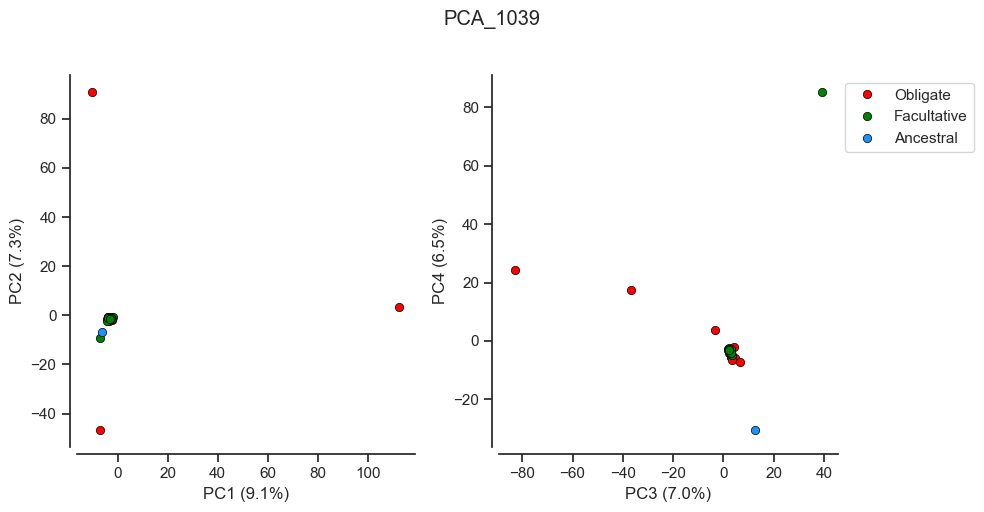

In [290]:
'''
pca
'''

# Load VCF data (only the genotype information)
callset = allel.read_vcf('./vcf_files/1039_all2.vcf', fields='*')

# Extract genotype data
gt = allel.GenotypeArray(callset['calldata/GT'])

# Extract sample names
samples = callset['samples']

#Count alleles at each variant. This takes a minute or so.
ac = gt.count_alleles()[:]

'''
Before going any further, I’m going to remove singletons SNPs. 
Singletons are not informative for PCA, '''

#How many biallelic singletons?
np.count_nonzero((ac.max_allele() == 1) & ac.is_singleton(1))

# Transform genotype data to 2D array of allele counts
gn = gt.to_n_alt()

# Replace missing data (if any) with the mean allele count
gn = np.nan_to_num(gn, nan=np.nanmean(gn))

# conventional PCA analysis
coords1, model1 = allel.pca(gn, n_components=10, scaler=None)

# read population asignment file
df_samples = pd.read_csv('./popfiles/pop_1039.txt', delimiter='\t', index_col='index')
df_samples.head()

populations = df_samples.population.unique()
populations

# coloring populations
pop_colours = {
    'Obligate': '#FF0000',
    'Facultative': '#008000',
    'Ancestral': '#1E90FF',
}

# pca plotting functions
def plot_pca_coords(coords, model, pc1, pc2, ax, sample_population):
    sns.despine(ax=ax, offset=5)
    x = coords[:, pc1]
    y = coords[:, pc2]
    for pop in populations:
        flt = (sample_population == pop)
        ax.plot(x[flt], y[flt], marker='o', linestyle=' ', color=pop_colours[pop], 
                label=pop, markersize=6, mec='k', mew=.5)
    ax.set_xlabel('PC%s (%.1f%%)' % (pc1+1, model.explained_variance_ratio_[pc1]*100))
    ax.set_ylabel('PC%s (%.1f%%)' % (pc2+1, model.explained_variance_ratio_[pc2]*100))
    

def fig_pca(coords, model, title, sample_population=None):
    if sample_population is None:
        sample_population = df_samples.population.values
    # plot coords for PCs 1 vs 2, 3 vs 4
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(1, 2, 1)
    plot_pca_coords(coords, model, 0, 1, ax, sample_population)
    ax = fig.add_subplot(1, 2, 2)
    plot_pca_coords(coords, model, 2, 3, ax, sample_population)
    ax.legend(bbox_to_anchor=(1, 1), loc='upper left')
    fig.suptitle(title, y=1.02)
    fig.tight_layout()
    fig.savefig("./figures/1039/PCA_1039.pdf") # change the path for different strains
fig_pca(coords1, model1, 'PCA_1039')

In [233]:
''' there are some outliers, let's look at them
1039: P1-D07, P1-D04, P1-E07
1051: P1-A05, P1-A06
1063: P2-F12, P2-G01. 
1069: P1-A01, P1-A02, and P1-B08. 

Those samples have less missing data compare to others
'''
# check the outliers
pca_c =pd.DataFrame({'sample':callset['samples'], 'pc1':coords1[:, 0],'pc2':coords1[:, 1],'pc3':coords1[:, 2],'pc4':coords1[:, 3]})
pca_c

,sample,pc1,pc2,pc3,pc4
0,P1-D03,-3.646148,-1.313442,2.318912,-4.132252
1,P1-D04,-6.976367,-46.839470,-82.979027,24.221819
2,P1-D05,-3.427012,-2.270988,3.113453,-5.608202
3,P1-D06,-2.226833,-2.016467,3.127499,-5.656937
4,P1-D07,112.747353,3.566830,-3.194356,3.771393
5,P1-D12,-3.826949,-0.736541,4.568981,-5.907460
6,P1-E01,-3.483626,-1.717108,4.298444,-2.214804
7,P1-E06,-4.265059,-1.587565,3.252637,-6.685289
8,P1-E07,-10.357072,90.924316,-36.746433,17.282600
9,P1-E08,-2.820858,-0.888017,2.292547,-3.590896


/Users/congliu/miniconda3/envs/popgen/lib/python3.11/site-packages/allel/io/vcf_read.py:1732: UserWarning: invalid INFO header: '##INFO=<ID=VDB,Number=1,Type=Float,Description="Variant Distance Bias for filtering splice-site artefacts in RNA-seq data (bigger is better)",Version="3">\n'
  warnings.warn('invalid INFO header: %r' % header)


 P1-A03: 2165 private doubletons, 6446 total variants
 P1-A04: 1305 private doubletons, 4730 total variants
 P1-A05: 2962 private doubletons, 8114 total variants
 P1-A06: 2530 private doubletons, 7188 total variants
 P1-A07: 1910 private doubletons, 5878 total variants
 P1-B03: 1430 private doubletons, 4940 total variants
 P1-B04: 1454 private doubletons, 4982 total variants
 P1-B10: 620 private doubletons, 3348 total variants
 P1-B11: 1444 private doubletons, 4978 total variants
 P1-C05: 1571 private doubletons, 5294 total variants
 P1-C06: 1269 private doubletons, 4630 total variants
 P1-C07: 2222 private doubletons, 6554 total variants
 P1-C08: 1582 private doubletons, 5216 total variants
 P1-C09: 1379 private doubletons, 4824 total variants
 P2-A05: 1368 private doubletons, 4918 total variants
 P2-A06: 2045 private doubletons, 6164 total variants
 P2-A07: 523 private doubletons, 3146 total variants
 P2-A08: 1090 private doubletons, 4332 total variants
 P2-A09: 475 private doubleton

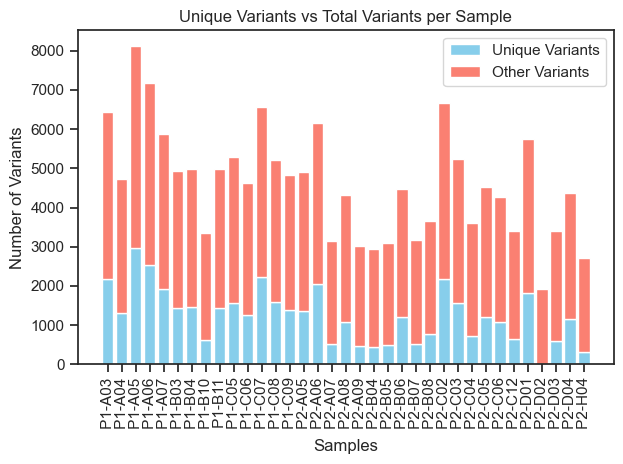

In [21]:
'''
Identifying singletons/private doubletons in a VCF
Here, we will looka at rare, individual-specific variation in our dataset


'''
# Load the VCF data
callset = allel.read_vcf("./vcf_files/1051_all2.vcf", fields=['samples','calldata/GT'])

# Extract genotype data
gt = allel.GenotypeArray(callset['calldata/GT'])

# Extract sample names
samples = callset['samples']

# Initialize a list to store counts of private doubletons and all variants for each individual
private_doubletons_counts = []
total_variants_counts = []

# Iterate over each individual treating them as a separate population
for i in range(gt.n_samples):
    # Compute allele counts for this individual
    ac_individual = gt[:, i:i+1].count_alleles()

    # Count all non-reference variants for this individual
    total_variants = np.sum(gt[:, i] > 0)
    total_variants_counts.append(total_variants)

    # Identify doubletons in this individual
    doubletons_individual = (ac_individual[:, 1] == 2)

    # Check if these doubletons are absent in other individuals
    indices_others = list(itertools.chain(range(i), range(i + 1, gt.n_samples)))
    ac_others = gt.take(indices_others, axis=1).count_alleles()
    private_doubletons = doubletons_individual & (ac_others[:, 1] == 0)

    # Count private doubletons
    n_private_doubletons = np.sum(private_doubletons)
    private_doubletons_counts.append(n_private_doubletons)

# Print results
for i, (private_doubletons, total_variants) in enumerate(zip(private_doubletons_counts, total_variants_counts)):
    print(f" {samples[i]}: {private_doubletons} private doubletons, {total_variants} total variants")

# 

# plot the results

# Number of samples
n_samples = len(private_doubletons_counts)

# Calculate the number of other variants (total variants minus private doubletons)
other_variants_counts = [total_variants_counts[i] - private_doubletons_counts[i] for i in range(n_samples)]

# Set up the bar chart
x = np.arange(n_samples)  # the label locations

# Create stacked bars
plt.bar(x, private_doubletons_counts, label='Unique Variants', color='skyblue')
plt.bar(x, other_variants_counts, bottom=private_doubletons_counts, label='Other Variants', color='salmon')

# Add labels and title
plt.xlabel('Samples')
plt.ylabel('Number of Variants')
plt.title('Unique Variants vs Total Variants per Sample')
plt.xticks(x, [f' {samples[i]}' for i in range(n_samples)], rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.savefig("./figures/1051/unique_variations_1051.pdf") # change the path for different strains
plt.show()